<a href="https://colab.research.google.com/github/schedldave/cv2021/blob/dev/02_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 02 - OpenCV
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/schedldave/cv2021/blob/main/01_PythonTutorial.ipynb)
## Dr. David C. Schedl

Note: this tutorial is geared towards students **experienced in general programming** and aims to introduce you to OpenCV, which we use in the computer vision course.

Adapted from: 
* http://6.869.csail.mit.edu/fa19/schedule.html (written by Julie Ganeshan; @MIT)

Useful links:
* OpenCV Tutorials: https://docs.opencv.org/master/d9/df8/tutorial_root.html


# Contents

Table of Contents  
- [OpenCV (Computer Vision)](#OpenCV)
    - Reading images
    - Channels, Image Formats, and using images as arrays
    - Showing images
    - Basic image operations - Resize, Color, and more
    - Working with Video

# Initilization

Let's import useful libraries, first.

In [1]:
import os
import cv2 # openCV
import numpy as np
import matplotlib.pyplot as plt

We work with images today. So let's download some.
You can download images with the Unix command `wget`. Images are in the local filesystem after downloading.

Image sources:

* [Place Kitten](https://placekitten.com/) - Of course, we will use pictures of cats! We use the base Place Kitten URL followed by a width and height separated by backslashes ''/''. For example, use the URL `https://placekitten.com/500/300` to fetch a cat image with a width of 500px and height of 300px.
* A picture of [Van Gogh from wikimedia](https://upload.wikimedia.org/wikipedia/commons/thumb/b/b2/Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg/842px-Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg) in a decent resolution. 
* You can use any other image, if you want.

In [33]:
!wget -O "cat.jpg" "https://placekitten.com/500/300"

!wget -O "gogh.jpg" "https://upload.wikimedia.org/wikipedia/commons/thumb/b/b2/Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg/842px-Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg"

--2021-03-18 21:41:31--  https://placekitten.com/500/300
Resolving placekitten.com (placekitten.com)... 104.21.48.66, 172.67.180.80, 2606:4700:3035::ac43:b450, ...
Connecting to placekitten.com (placekitten.com)|104.21.48.66|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [image/jpeg]
Saving to: ‘cat.jpg’

cat.jpg                 [ <=>                ]  19.22K  --.-KB/s    in 0.001s  

2021-03-18 21:41:31 (25.9 MB/s) - ‘cat.jpg’ saved [19679]

--2021-03-18 21:41:31--  https://upload.wikimedia.org/wikipedia/commons/thumb/b/b2/Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg/842px-Vincent_van_Gogh_-_Self-Portrait_-_Google_Art_Project.jpg
Resolving upload.wikimedia.org (upload.wikimedia.org)... 208.80.154.240, 2620:0:861:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|208.80.154.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 323317 (316K) [image/jpeg]
Saving to: ‘gogh.jpg’

gogh.jpg          

# OpenCV

OpenCV is an extremely popular computer vision library built in C++, with many powerful tools for CV. It lets you read, write, and show images and videos, read from webcam streams, find matching keypoints between two images, and more.

OpenCV is written in C++, however, there is a Python library that uses these optimized C++ libraries, and exposes an API using numpy arrays!

Let's import OpenCV

In [ ]:
import cv2

## Reading Images

You can use the `imread` function to read in an image from a filepath.

In [41]:
image = cv2.imread("gogh.jpg")

Images in OpenCV are represented as numpy arrays!

In [42]:
type(image), image.shape, image.dtype

(numpy.ndarray, (1023, 842, 3), dtype('uint8'))

## Channels and Image Formats
The shape of a color image is (height, width, colors BGR) \
While it may seem strange that the height is first, it's because OpenCV treats images as "Rows" and "Columns" of an image. The "height" of an image is the number of rows!

Color images consist of "channels" - each color we can render is some combination of red, green, and blue (OR, in the case of a grayscale image, gray).

In [21]:
image.shape

(512, 1024, 3)

You can see each pixel is represented by 3 values (uint8 means they are between 0 and 255)

In [22]:
image[0,0] # Get the pixel located at (0,0) from the top left

array([10, 10, 10], dtype=uint8)

## Showing the image 

If you're running scripted Python (not Jupyter notebook) The `imshow` command will display an image. However, this doesn't work in jupyter notebook (see [this issue](https://github.com/jupyter/notebook/issues/3935))

As a replacement, you can use the following function: 
`from google.colab.patches import cv2_imshow`

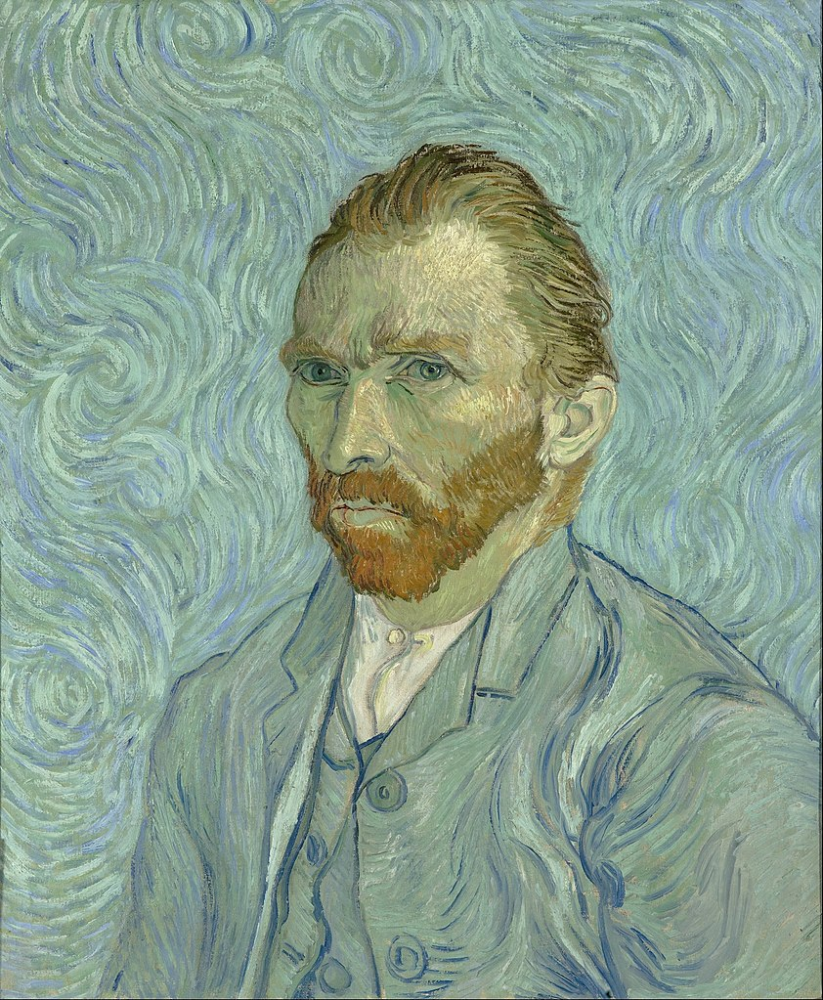

In [43]:
# This line only works if you're running locally
# cv2.imshow('test', image)

from google.colab.patches import cv2_imshow
cv2_imshow(image)

## Color channels

Let's seperate the color channels and display them:

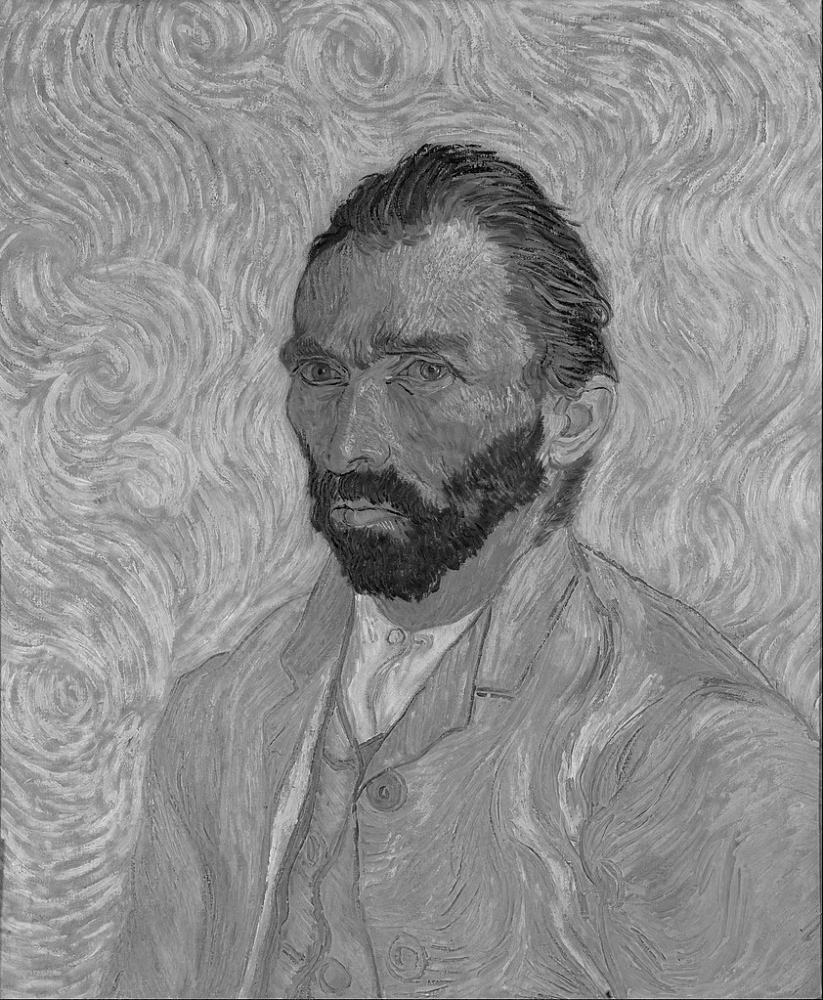

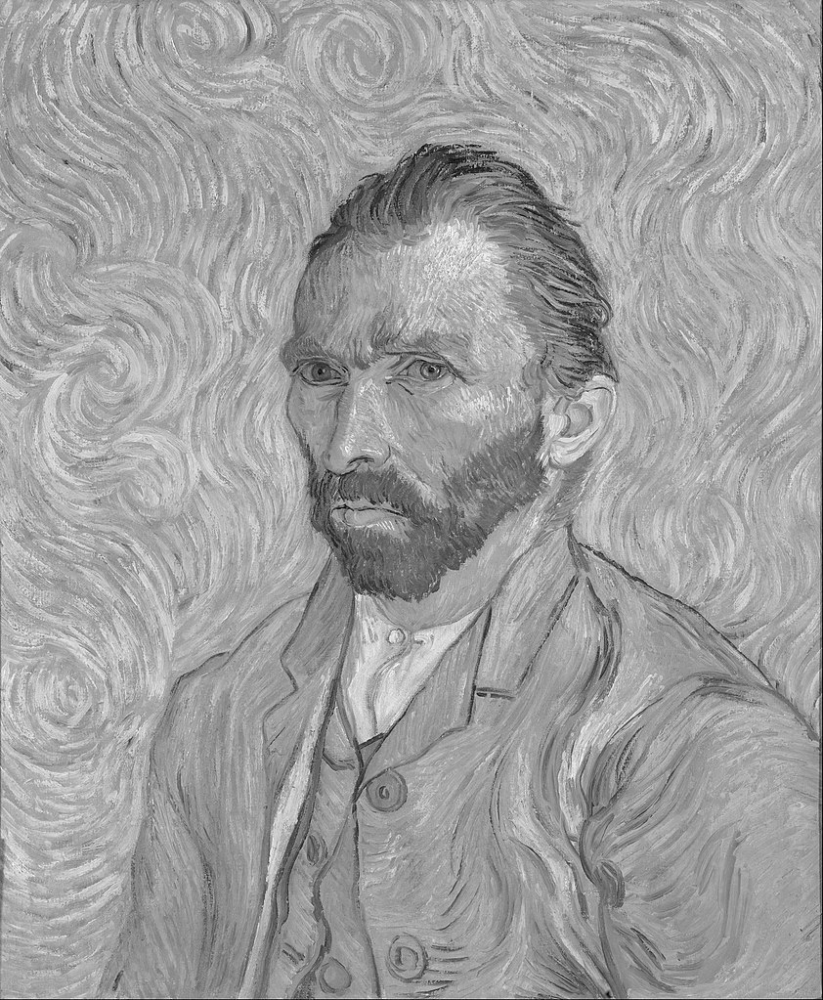

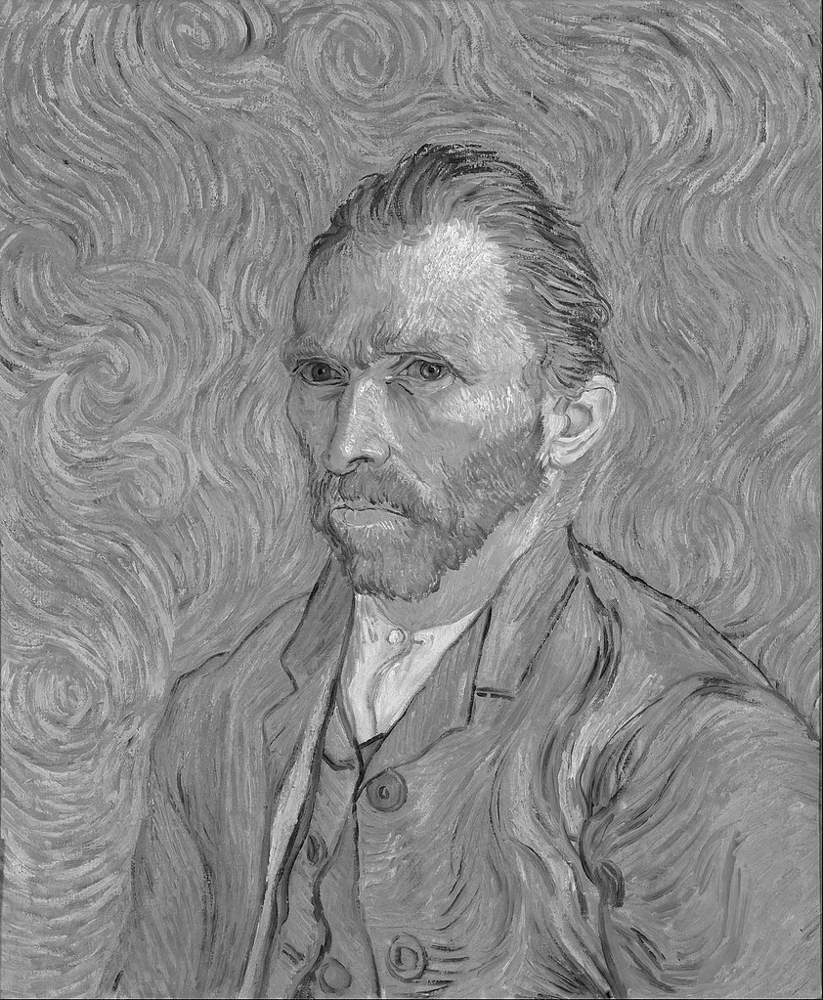

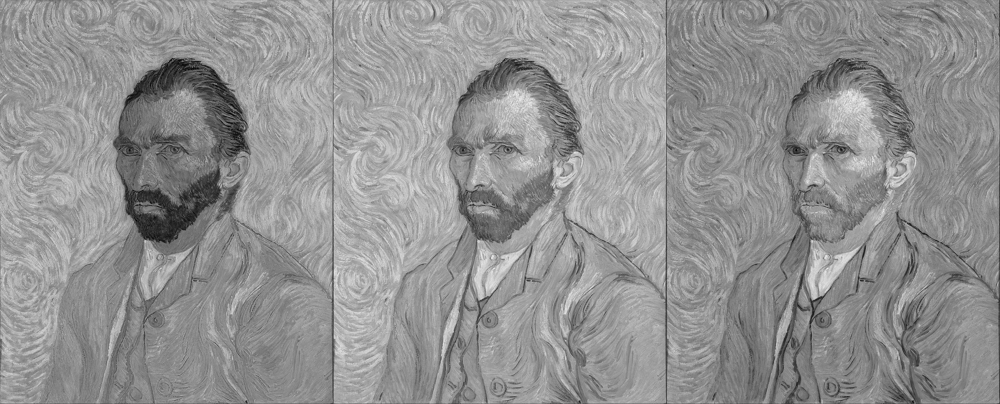

In [49]:
c1, c2, c3 = image[:,:,0], image[:,:,1], image[:,:,2]

# let's display them
cv2_imshow(c1)
cv2_imshow(c2)
cv2_imshow(c3)

# or in a row by concatinating them
cv2_imshow( np.concatenate((c1,c2,c3), axis=1) )

## Manipulating images



### Changing individual channels


We also can manipulate it by doing anything we would to a normal array. Let's make an image that includes the the *green* channel as the *blue* channel and *red* channels, and nothing in the green channels.

Created image of shape (1023, 842, 3)


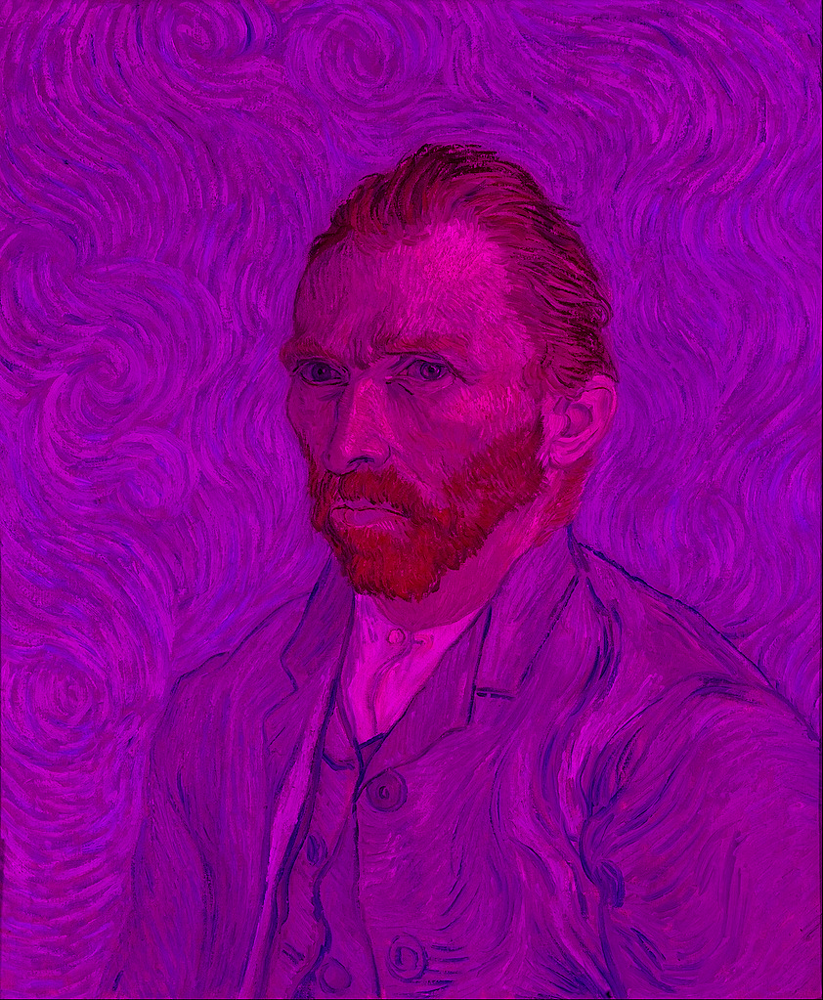

In [50]:
empty_arr = np.zeros(c2.shape, dtype=np.uint8)

# Stack them, making the 3rd axis
manipulated_image = np.stack([ c1, empty_arr, c3, ], axis=2)
print("Created image of shape",manipulated_image.shape)
cv2_imshow(manipulated_image)

## Writing an Image

The `imwrite` function can write out an image. Let's write out the image we just made, so we can use it later!

In [51]:
output_path = os.path.join("output.png")
cv2.imwrite(output_path, manipulated_image)

True

We should be able to read that image directly from the file. Let's try!

Read file of shape: (1023, 842, 3) type uint8


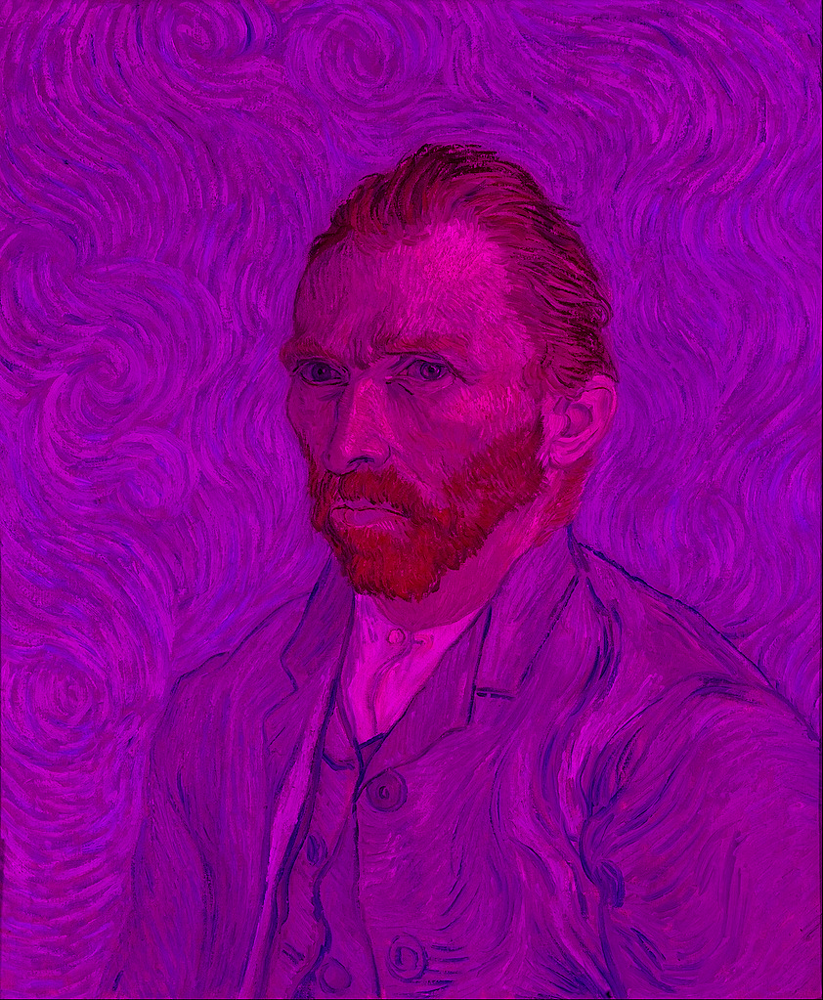

In [53]:
test_read_output = cv2.imread(output_path)
print("Read file of shape:",test_read_output.shape, "type",test_read_output.dtype)
cv2_imshow(test_read_output)

Everything works as expected!

## Display with Matplotlib

Additionally we can plot an image also with matplotlib. This is very useful if you want to draw on top of images. OpenCV provides basic functions, but Matplotlib is much better (e.g., dashed lines are not possible with OpenCV).

Since images are numpy array this should be easy, right?

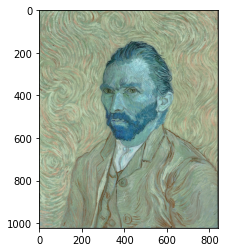

In [45]:
plt.imshow(image)
plt.show()


**Colors are not right! What is happening?**

By default, color images are opened by OpenCV as BGR, meaning the values for a given pixel are ordered "blue, green, red".

We can use the `cv2.cvtColor` function to change which color system our image is in.

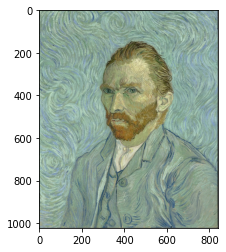

In [46]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.show()

Matplotlib assumes images are in the **RGB** format. OpenCV assumes that images are in the **BGR** format. So, we'll convert colors before showing the image. Here is a function to show OpenCV images with matplotlib.

In [16]:
def imshow(image, *args, **kwargs):
    if len(image.shape) == 3:
      # Height, width, channels
      # Assume BGR, do a conversion since 
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    else:
      # Height, width - must be grayscale
      # convert to RGB, since matplotlib will plot in a weird colormap (instead of black = 0, white = 1)
      image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
    # Draw the image
    plt.imshow(image, *args, **kwargs)
    # We'll also disable drawing the axes and tick marks in the plot, since it's actually an image
    plt.axis('off')
    # Make sure it outputs
    plt.show()

# Exercises

## Exercise 3

**Edge detection** Our phoenix is lovely and bright - but what if we wanted to draw it? it might help to have the edges.

**(a)** Load the image `phoenix.jpg`. Covert it to grayscale. \
**(b)** Use the scipy.signal.convolve2d (aliased as `conv2d`) to compute the convolution of the phoenix and the `kernel` (make sure to cast to a float32 between 0 and 1 first). Use imshow to show the results. Use `prep_to_draw` to convert a [0,1] BW image to a drawable image.

Black and white image


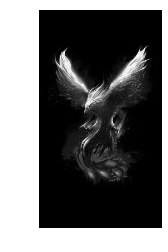

Edges


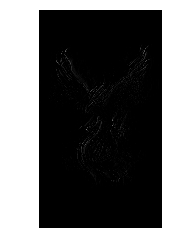

Box-blurred


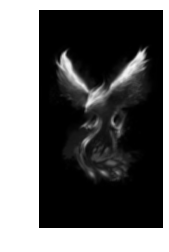

Sharpen of blurred img


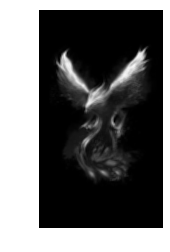

In [ ]:
import scipy
import scipy.signal

conv2d = scipy.signal.convolve2d
# looks for horizontal edges
horizontal_edge_detector = np.array(
  [
      [-1, 0, 1]
  ]
)

box_blur_size = 15
box_blur = np.ones((box_blur_size, box_blur_size)) / (box_blur_size ** 2)
sharpen_kernel = np.array(
    [
        [0, -1, 0],
        [-1, 5, -1],
        [0,  -1, 0]
    ]
)

all_edge_detector = np.array(
    [
        [0, -1, 0],
        [-1, 4, -1],
        [0,  -1, 0]
    ]
)



def prep_to_draw(img):
  # Scale to 0,255
  prepped = img * 255
  # Clamp to [0, 255]
  prepped[prepped < 0] = 0.0
  prepped[prepped > 255] = 255.0
  prepped = prepped.astype(np.uint8)
  return prepped

'''
SOLUTION:
'''


phoenix_image = cv2.imread(os.path.join(rootpath, "data","phoenix.jpg"))
bw = cv2.cvtColor(phoenix_image, cv2.COLOR_BGR2GRAY)
bw_norm = (bw / 255.0).astype(np.float32)
edges = conv2d(bw_norm, horizontal_edge_detector)
blurred = conv2d(bw_norm, box_blur)
sharpened = conv2d(blurred, sharpen_kernel)
# Apply a second time for greater effect
sharpened = conv2d(sharpened, sharpen_kernel)
# Feel free to try convolving with other kernels! I've added a few I like to the top.
print("Black and white image")
imshow(prep_to_draw(bw_norm))
print("Edges")
imshow(prep_to_draw(edges))
print("Box-blurred")
imshow(prep_to_draw(blurred))
print("Sharpen of blurred img")
imshow(prep_to_draw(sharpened))

#imshow(normed)